## San Francisco Crime Heatmap

In this lesson we will use the [basemap][1] library to create a simple heatmap of crime in San Franisco. We will be working with real world data from the website [data.sfgov.org][2] to put together our heatmap. Before we can start though, we first need to install the basemap library. Doing so is simple, since it's available via both `conda` and `pip` installs, you just need to choose whichever method you prefer and perform the installation. 

[1]: http://matplotlib.org/basemap/
[2]: https://data.sfgov.org

In [1]:
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Use the following only if you are on a high definition device
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# The current version of NumPy available from conda is issuing a warning 
# message that some behavior will change in the future when used with the 
# current version of matplotlib available from conda. This cell just keeps
# that warning from being displayed.
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

### Create a Basemap Object

To create our map object, we'll need a couple of things. First, we need to specify a projection to use. A map projection transforms the latitudes and longitudes of a locations on the surface of a sphere or an ellipsoid into x and y coordinates on a plane. Since the earth is a sphere (a 3-dimensional object), all 2-dimensional representations of the earth are just estimations of how it would look in 2-dimensions.  Cartographers are constantly looking for the best possible way to represent the earth with the least amount of distortion. The different ways that the earth can be represented 2-dimensionally are known as projections since they "project" the earth, in 3D space, onto a 2D space. 

When we create our map object, we'll need to specify the projection that we want to use to represent the world 2-dimensionally. We can specify a projection by passing in either the [`projection`][1] argument, or the [`epsg`][2] argument. The former is a string representing one of the projections supported by the basemap library (print the `basemap.supported_projections` for the full list). The default projection is the Cylindrical Equidistant ('cyl') projection. If you do not pass in a projection or an epsg number when creating your `Basemap` object, this is projection that you will get. This is a very simple projection that just maps the longitude and latitude values to the x and y coordinates of the 2D plane. While this projection is perfectly feasible, I prefer the [EPSG:3857][3] projection since it shows a bit more street level detail and looks less distorted to me since it matches the what I'm used to seeing in Mapping apps such as Apple and Google Maps. This makes quite a bit of sense since this projection was popularized by web-based mapping applications like Google Maps.

The second thing we need to specify is a bounding box for the bit of the map that we want to view. The Basemap constructor takes four different parameters that define this bounding box: the `urcrnrlat` and `urcrnrlon` parameters which describe the upper right corner of the bounding box, and the `llcrnrlat` and `llcrnrlon` parameters which describe the lower left corner of the box. One easy way to get these coordinates is to use Google Maps to get the latitudes and longitudes of each corner.

Open up a browser and navigate to [Google Maps][4]. Type 'San Franciso, CA' in the search box to center the map on San Francisco. Then, choose a point on the map that will serve as the upper right corner of the bounding box. This point will need to be far enough right so as to not cut off a portion of the city if a straight line were to be drawn through the point that was perpindicular to the bottom of the screen, and the same should be true for a line drawn through the point and perpindicular to the side of the screen. Right click on your chosen point and select "What's here?". A small rectangular box should pop up at the bottom of the screen containg, amongst other information, the latitude and longitude of the chosen point. This will be the lat/lon coordinates of the upper right corner of the bounding box. Now, do the same for the lower left corner and copy all of these coordinates into their cooresponding paramters to create the Basemap object that we'll use throughout this lesson.


[1]: http://matplotlib.org/basemap/users/mapsetup.html
[2]: http://spatialreference.org
[3]: http://spatialreference.org/ref/sr-org/6864/
[4]: https://www.google.com/maps/

In [2]:
map = Basemap(urcrnrlat=37.821981,     # top
              urcrnrlon=-122.343189,   # bottom
              llcrnrlat=37.697940,     # left
              llcrnrlon=-122.574915,   # right
              epsg=3857)

### Drawing the Map

Now that you have basemap installed, you're ready to display the map of San Francisco. We'll be using the `arcgisimage` method to retrieve a map image using the ArcGIS Server REST API. By default, this method pulls map images from the [arcgisonline][1] service, but you can override that to pull images from other REST-based ArcGIS services. We'll need to pick the type of map that we want to view. Fortunately, if you go to the [ArcGIS services] link, you will see a list of all the maps that the service provides. Select the one you want, in the example below, I've selected the 'World_light_Gray_Base' map in the 'Canvas' folder. 

We'll also specify the number of pixels in the x direction since the default of 400 is little small and lacking detail. The default dpi is 96, so I use that along with the image dimensions to come up with a rough number of x-pixels.

[1]: http://server.arcgisonline.com/ArcGIS/rest/services

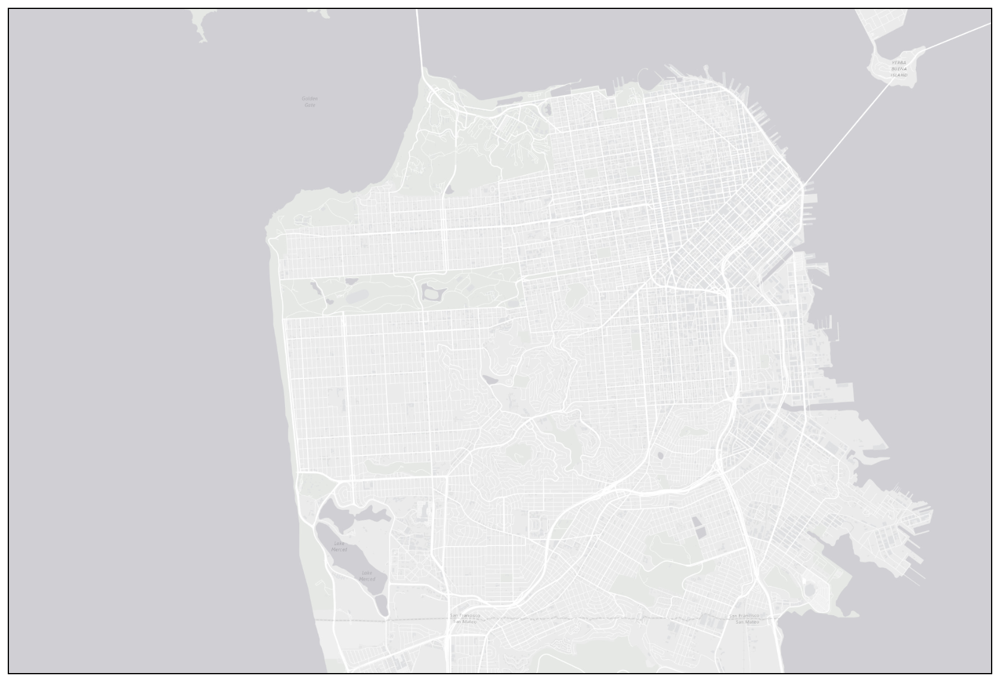

In [3]:
# The default DPI setting is 96, we're just specifying it here 
# to use it for calculating the number of x-axis pixels to request.
dpi = 96

# These are the dimensions of the map we'll create
width = 20
height = 10

plt.figure(figsize=(width, height))
map.arcgisimage(service='Canvas/World_Light_Gray_Base', 
                xpixels=dpi*width);

### Getting the Data

Now that we know how to get the map, the next thing we need to do is get the data. As I mentioned in the introduction, we'll be working with real world data from the [data.sfgov.org][1] website. So, the very first step is to click on the [link to the website][1] to open it up in a separate browser window. We'll be working with crime data, so you'll need to click on the [Public Safety][2] link, and then the link for [SFPD Incidents][3]. If you followed the links correctly, you should end up on a page that should look like the image below.

[1]: https://data.sfgov.org 
[2]: https://data.sfgov.org/data?category=Public%20Safety
[3]: https://data.sfgov.org/Public-Safety/SFPD-Incidents-from-1-January-2003/tmnf-yvry

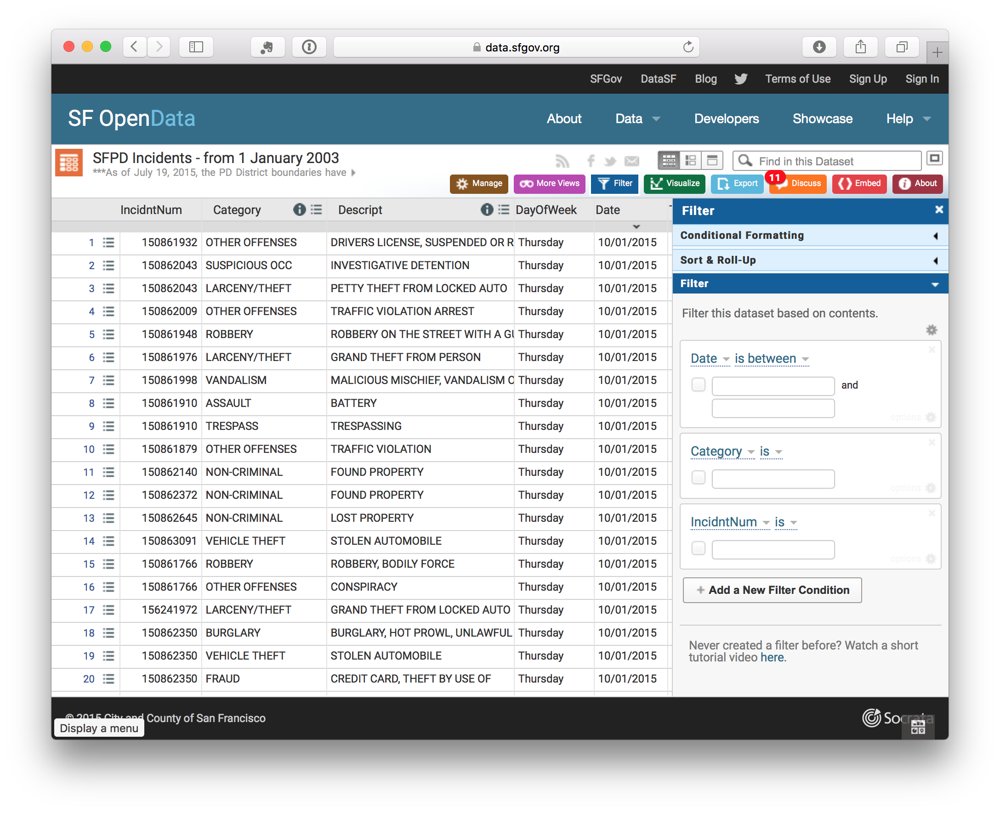

In [4]:
from IPython.display import Image
Image(filename='./images/SFPD Incidents.png') 

We are going to take a look at the crime in San Francisco for the past 6 months, so you'll need to select the beginning and end dates in the "Date is between" filter. The data being displayed will automatically update once you've selected your dates. Then, select the "Export" button at the top of the page and choose "JSON" as the download type. 

> At the time of this recording, the JSON file doesn't actually download to your machine, so you'll probably need to save the file once it's done loading.

Once, you get the file downloaded, just copy it over to the same directory as the notebook. To keep things clean, I like to have the data files in a separate subdirectory called `data`, and the code below assumes that is where the file will be located, so you can either add the `data` directory as I did, and move the json file into it, or keep it in the main directory. If you go with the latter option, just remember to update the location of the file in the call to `open()` below. One final note, unless you change the name when you download the file, it will be saved as `rows.json`, but that's not a very descriptive name, so I changed mine to `sfpd.json`. You can use either name, but again, remember if you don't change the name, you'll need to alter the code below for it to work.

> Incidentally, if you are following along and would like to get the exact same results as me, you may want to use the same dates that I do. As of this recording, the past six month period would be 04/01/2015 - 10/01/2015.

In [5]:
import json

with open('../data/sfpd.json') as fin:
    data = json.load(fin);

We now have the data as a simple python dict, but we can do a little better than that. The data we got back from the website has two main attributes: a `data` object which is just an array of incidents, and a `meta` object that describes the format of each incident object. We can extract the names of all of the columns from the `meta` object and use them to create a list of namedtuples. 

In [6]:
from collections import namedtuple

columns = [obj['name'] for obj in data['meta']['view']['columns']]
Incident = namedtuple('Incident', columns)
incidents = [Incident(*row) for row in data['data']]    

Now that we have the data in a format that's a little easier to work with, we can extract the lat/long coordinates from the data.

In [7]:
lon = [float(i.X) for i in incidents]
lat = [float(i.Y) for i in incidents]

If you remember, a projection maps longitude and latitude (in degrees) coordinates to x and y coordinates on a plane. So, for us to plot our data on the map properly, we'll first need to convert the longitude and latitude for each crime incident to the x and y coordinates in our map. Calling a Basemap class instance with two arguments: a list of longitudes and a list of latitudes, will convert the lon/lat lists (in degrees) into lists of x/y map projection coordinates (in meters). Incidentally, calling a Basemap instance with the `inverse` option set to True will reverse this transformation.

> If you used the default projection 'cyl' rather than specifying an EPSG projection, you can skip this part since the Cylindrical Equidistant projection directly maps lon/lat coordinates to x/y points in the projection.

In [8]:
x, y = map(lon, lat)

### Drawing the Heatmap

Now, we have our map and we have our data, so the only step left is to combine the two. Just like we did above, we'll first set the dimensions of the map. Then, we draw the map just as we did above. Finally, we will call the `scatter` method on the `map` object and pass into it the x/y coordinates we created in the last step. I also changed a few aethetic features as well. First, I change the color of markers to red and set the `alpha` (the opacity of the marker) to only 1%. The alpha setting is the important one since it allows the map the show different concentrations of crime with more or less intensity. Without this setting the map would be awash in a sea of red and all information that we could discern would be lost. Finally, I changed the size of the markers slightly and removed the lines around markers by setting linewidths to 0.

/Users/croach/anaconda/envs/mpl/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


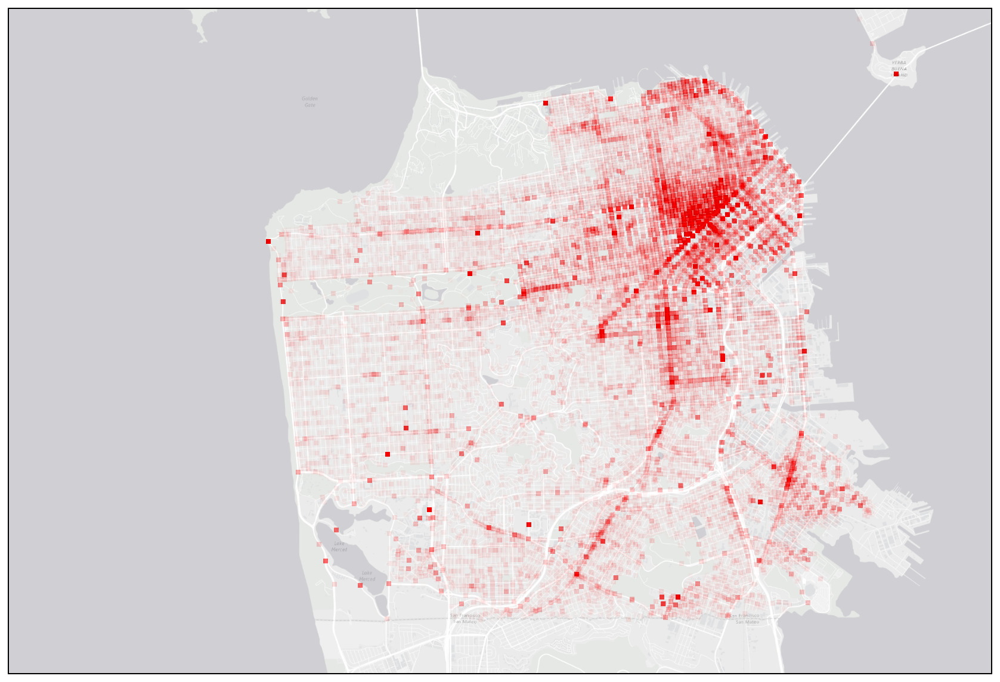

In [9]:
plt.figure(figsize=(width, height))
map.arcgisimage(service='Canvas/World_Light_Gray_Base', 
                xpixels=dpi*width)
map.scatter(x, y, s=15, c='r', marker='s', alpha=0.01, linewidths=0);

### A Few More Examples

The rest of this section just shows a few more options that are available to us that we could've used to in place of the light gray map that we went with above.

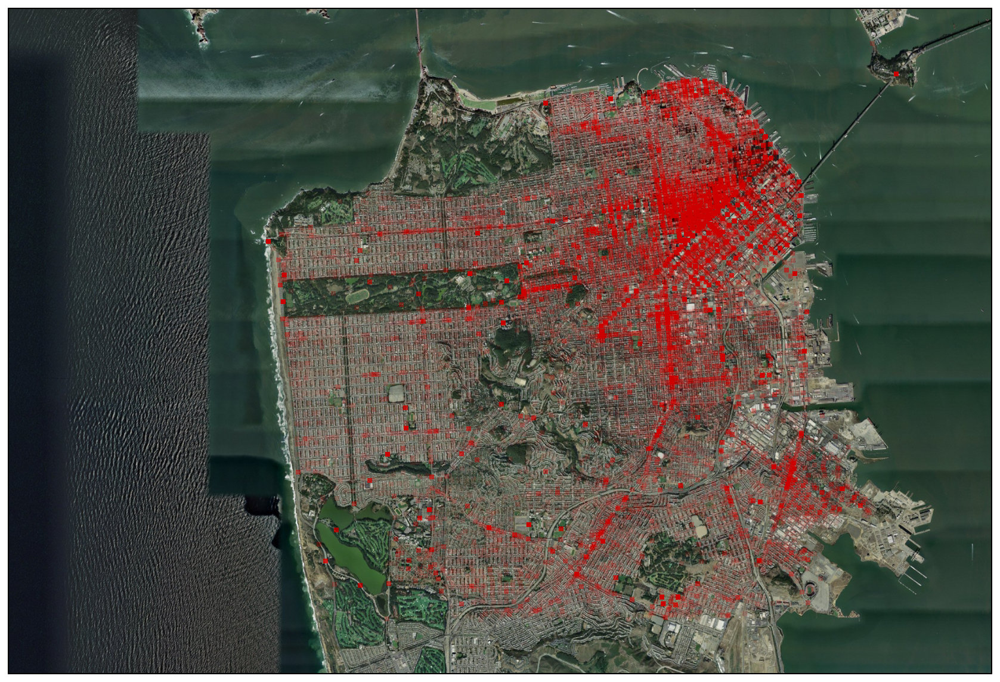

In [10]:
plt.figure(figsize=(width, height))
map.arcgisimage(service='ESRI_Imagery_World_2D', xpixels=dpi*width)
map.scatter(x, y, s=15, c='r', marker='s', alpha=0.02, linewidths=0);

#### Using a Different Server

I mentioned in the section titled "Drawing the Map" that by default the `arcgisimage` method uses the [argisonline service][1], but that you could override this default setting. In the example below I do this by setting the `server` parameter so that I can pull maps from [ArcGIS service][2] provided by the [U.S. Geological Survey (USGS)][3].

[1]: http://server.arcgisonline.com/ArcGIS/rest/services
[2]: http://basemap.nationalmap.gov/arcgis/rest/services
[3]: http://www.usgs.gov

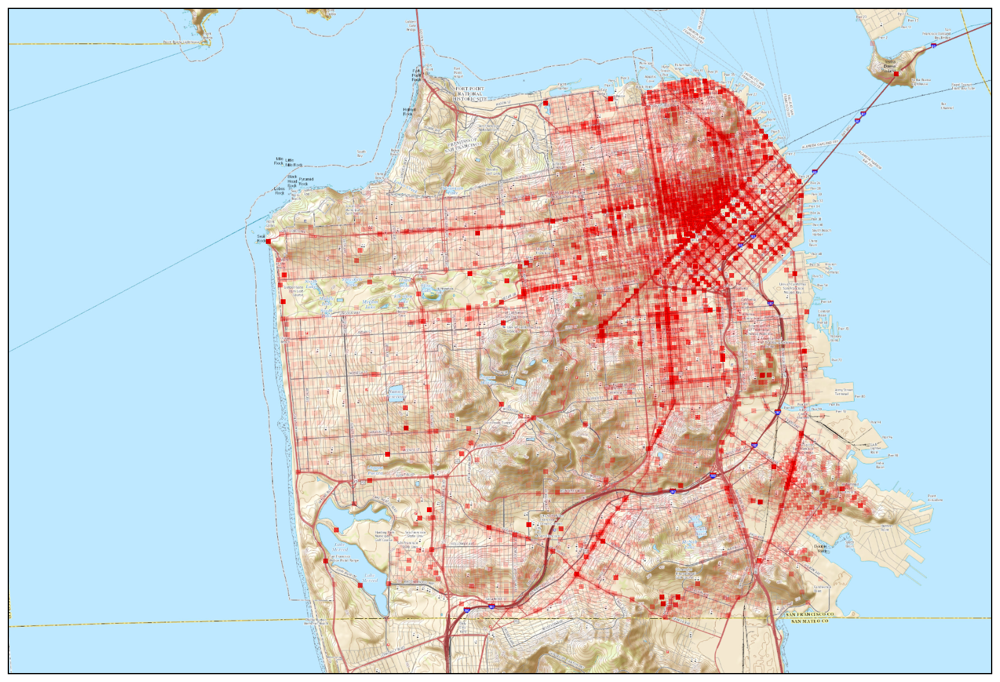

In [11]:
plt.figure(figsize=(width, height))
map.arcgisimage(server='http://basemap.nationalmap.gov/arcgis',
                service='USGSTopo', 
                xpixels=dpi*width)
map.scatter(x, y, s=15, c='r', marker='s', alpha=0.02, linewidths=0);